
# Digital Elevation Model Analysis using RichDEM
---
This note book provides an example of how to use the RichDEM library to calculate flow accumulation for a given digital elevation model. Flow accumulation can be used to identify streamFlow accumulation assigns each downslope cell a value which is the accumlated weight of the flow contributed by upstream cells and the flow generated by the downslope cell. If every cell apportions all (100%) of its flow then the accumulated flow value indicates the number of cells flowing into each cell. RichDEM allows the direct adjustment of flow proportions but that is more complex use not covered in this notebook.

Several different algorithms to apportion the contributing flow, also refered to as flow metrics, can be easily selected from the library. The D-infinity flow metric proposed in Tarboton 1997 is primarily used in this notebook. 

Any digital elevation model can be used but the quality of the model can significantly effect the quality of the results. Often, raw DEMs contain feature which make conducting analysis difficult or ambiguous. Two such cases are depressions, where all surrounding cells are higher, and flat regions, where all surrounding cells are of equal elevation. In order to conduct a flow analysis these features need to be dealt with so that the DEM fully drains. Caution should be used, however, as resolving these features could result in significant modification to the DEM.


## Installation and Required Imports
---
If RichDEM is not yet installed use pip to add it. RichDEM is then imported as rd for ease of typing.

In [1]:
pip install richdem

Note: you may need to restart the kernel to use updated packages.


In [2]:
import richdem as rd

Rasterio is used to manipulate DEMs stored in the GeoTIFF format 

In [3]:
import rasterio
from rasterio.windows import Window

Numpy is handy for manipulating the arrays and dealing with nans

In [4]:
import numpy as np

## Importing a DEM as a GeoTIFF
---
If external source is used, the DEM may be stored as a GEOTIFF. RichDEM is able to easily handle GEOTIFFs but many times the desired area is only a part of the provided extent. We can use rasterio to extract just the area we would like to see. The following DEM was obtained from the MERIT dataset.

In [5]:
dem = rd.LoadGDAL("./n10w020_dem.tif")

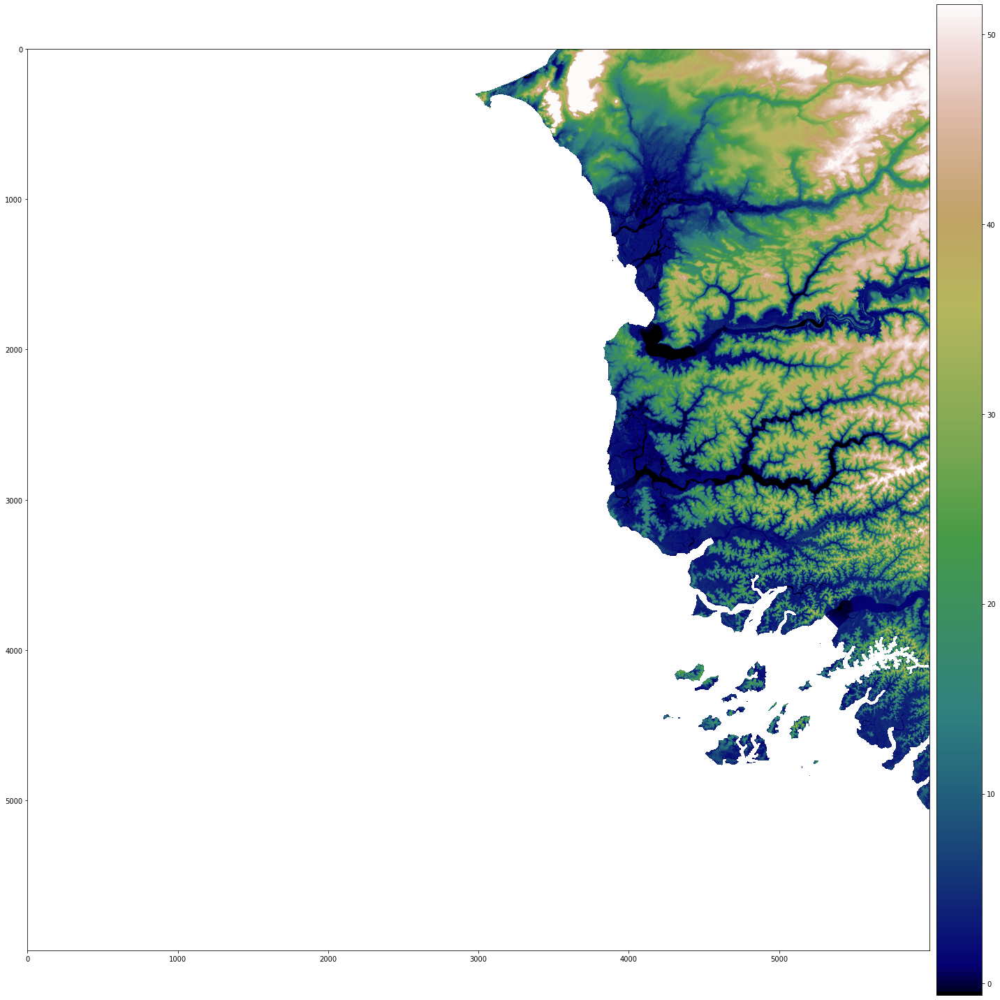

{'vmin': -0.6001630890369415, 'vmax': 51.56449264526367}

In [6]:
rd.rdShow(dem, axes=True, cmap="gist_earth", figsize=(20, 20))

### Selecting an area of a GeoTIFF
Let's say that we would like to concentrate on the region of Dakar. We can look at only that region by using Window from Rasterio to read in our area of interest. The bounds were determined by eyballing the pixel coordinates from above

In [7]:
with rasterio.open("./n10w020_dem.tif") as src:
    dakar_slice = src.read(1, window=Window(2800, 0, 800, 600))

In [8]:
dakar_dem = rd.rdarray(dakar_slice, no_data=-9999)
dakar_dem

rdarray([[-9999.      , -9999.      , -9999.      , ...,    23.254402,
             22.593271,    23.151716],
         [-9999.      , -9999.      , -9999.      , ...,    22.335863,
             22.343122,    23.32777 ],
         [-9999.      , -9999.      , -9999.      , ...,    21.624578,
             21.652967,    23.484879],
         ...,
         [-9999.      , -9999.      , -9999.      , ...,    19.07665 ,
             21.29177 ,    20.542862],
         [-9999.      , -9999.      , -9999.      , ...,    21.421732,
             22.04604 ,    21.413664],
         [-9999.      , -9999.      , -9999.      , ...,    21.692915,
             20.94717 ,    22.2173  ]], dtype=float32)

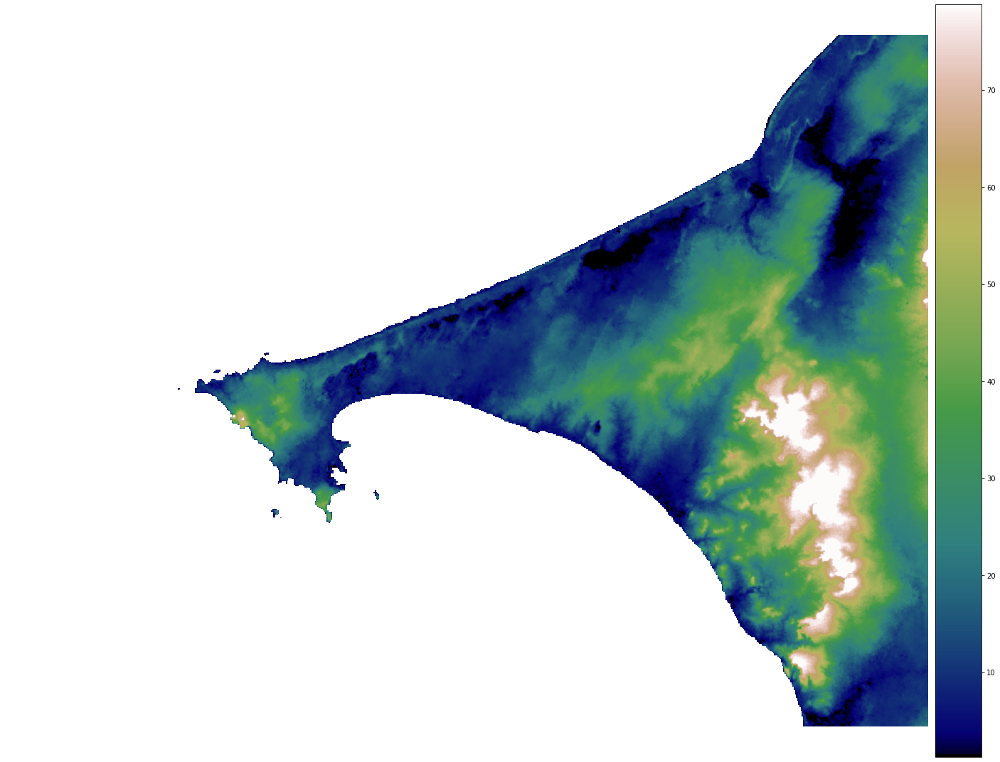

{'vmin': 1.2704766750335694, 'vmax': 78.81104583740232}

In [9]:
rd.rdShow(dakar_dem, axes=False, cmap="gist_earth", figsize=(20, 15))

## Fill Depressions in the DEM
---
Here we use the FillDepressions method to identify and fill the depressions in the DEM. By setting the epsilon parameter to true we instruct that a a small gradient should be applied toward the lowest egress to avoid creating flat regions of ambigious flow.

In [10]:
filled_dem = rd.FillDepressions(dem, epsilon=True)

Below we can see the modifications made to the DEM by filling the deperession by subtracting the original DEM from the filled DEM

In [11]:
dem_diff = filled_dem - dem

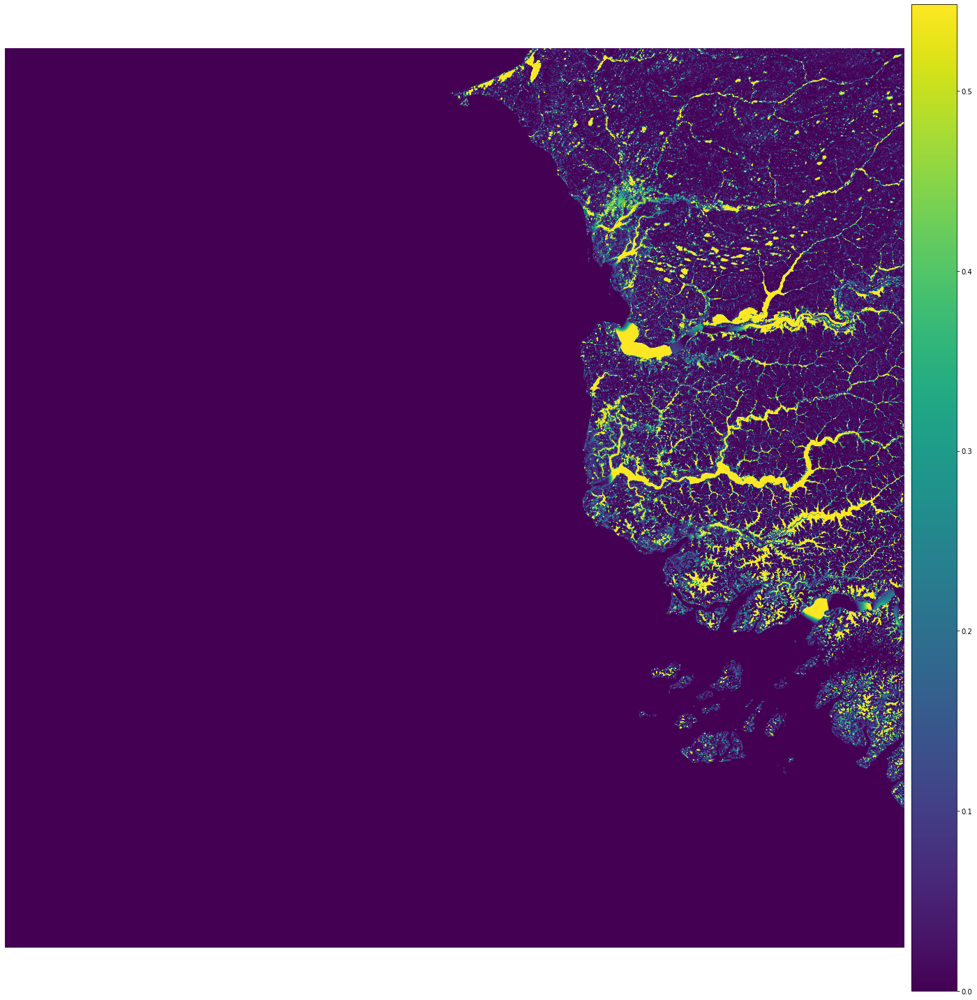

{'vmin': 0.0, 'vmax': 0.5480537509918193}

In [12]:
rd.rdShow(dem_diff, axes=False, cmap="viridis", figsize=(20, 20))

## Calculate the Flow Accumulation
---
Now that the DEM has been conditioned the FlowAccumulation method can be applied.

In [13]:
accum_flow = rd.FlowAccumulation(filled_dem, method="Dinf")

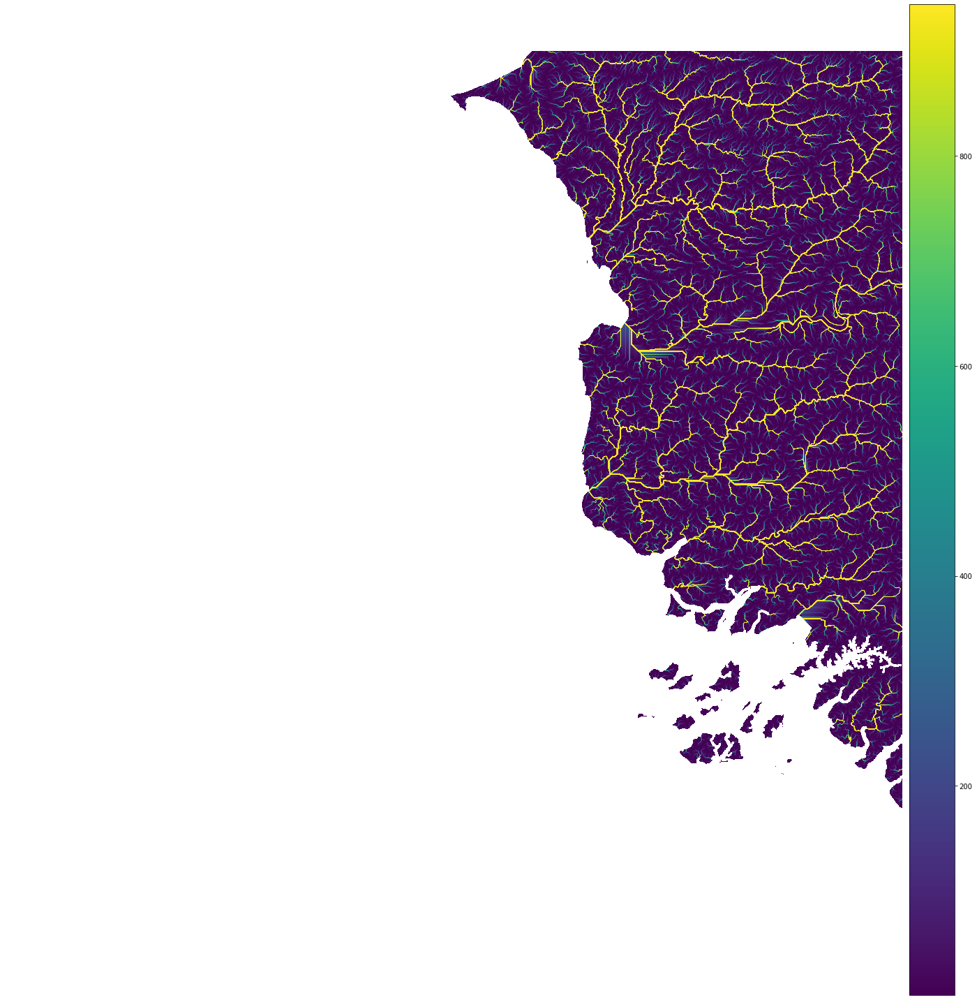

{'vmin': 1.0, 'vmax': 943.8819541826426}

In [14]:
rd.rdShow(accum_flow, axes=False, cmap="viridis", figsize=(20, 20))

Here we can see what the results would be if we had not filled the depressions before conducting the flow accumulation

In [15]:
flow_no_fill = rd.FlowAccumulation(dem, method="Dinf")

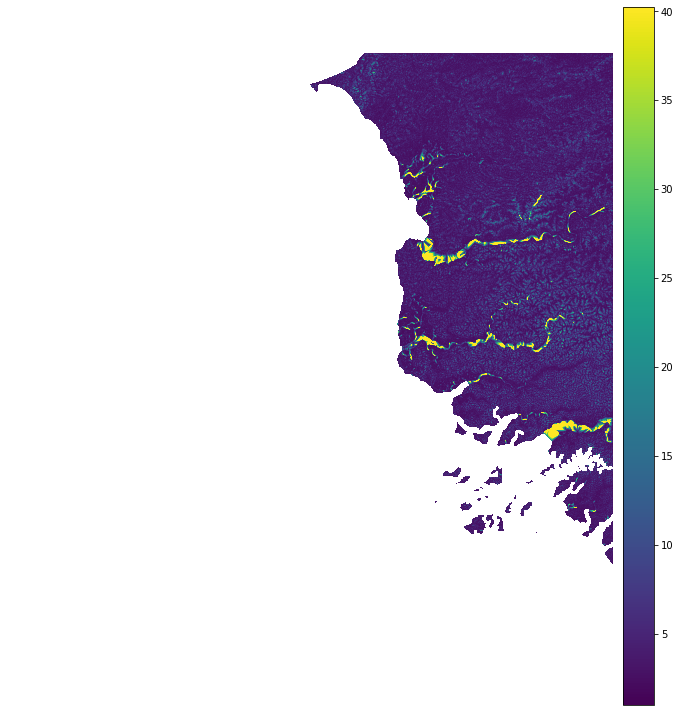

{'vmin': 1.0, 'vmax': 40.24467680437574}

In [16]:
rd.rdShow(flow_no_fill, axes=False, cmap="viridis", figsize=(10, 10))

We can also use the FlowAccumulation on the indset array of our area of interest. Again without filling the depressions and with the depressions filled.

In [17]:
dakar_no_fill = rd.FlowAccumulation(dakar_dem, method="Dinf")

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


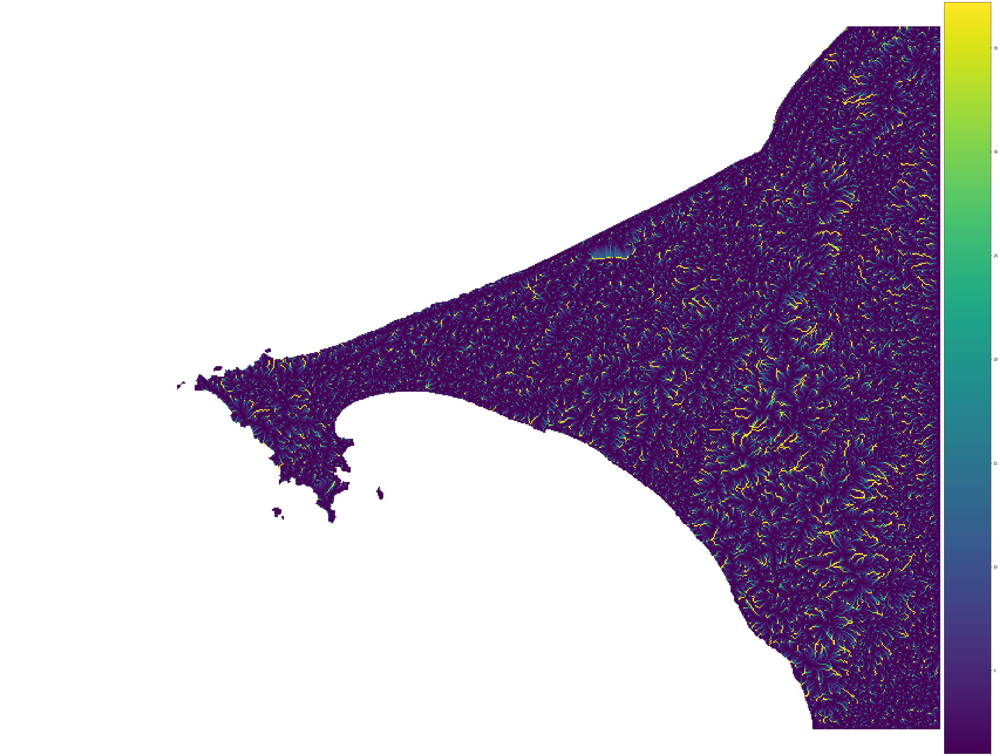

{'vmin': 1.0, 'vmax': 37.197708748717744}

In [18]:
rd.rdShow(dakar_no_fill, axes=False, cmap="viridis", figsize=(40, 30))

In [19]:
dakar_fill = rd.FillDepressions(dakar_dem, epsilon=True)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [20]:
dakar_diff = dakar_fill - dakar_dem

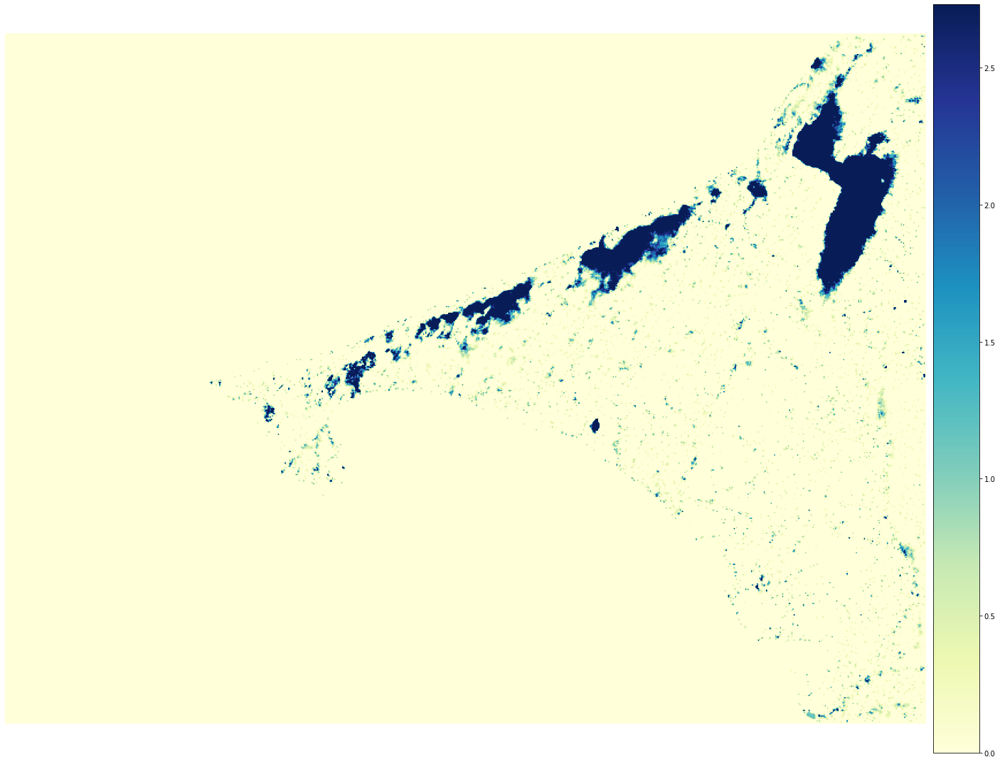

{'vmin': 0.0, 'vmax': 2.7311219787597683}

In [21]:
rd.rdShow(dakar_diff, axes=False, cmap="YlGnBu", figsize=(20, 15))

In [22]:
dakar_flow_fill = rd.FlowAccumulation(dakar_fill, method="Dinf")

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


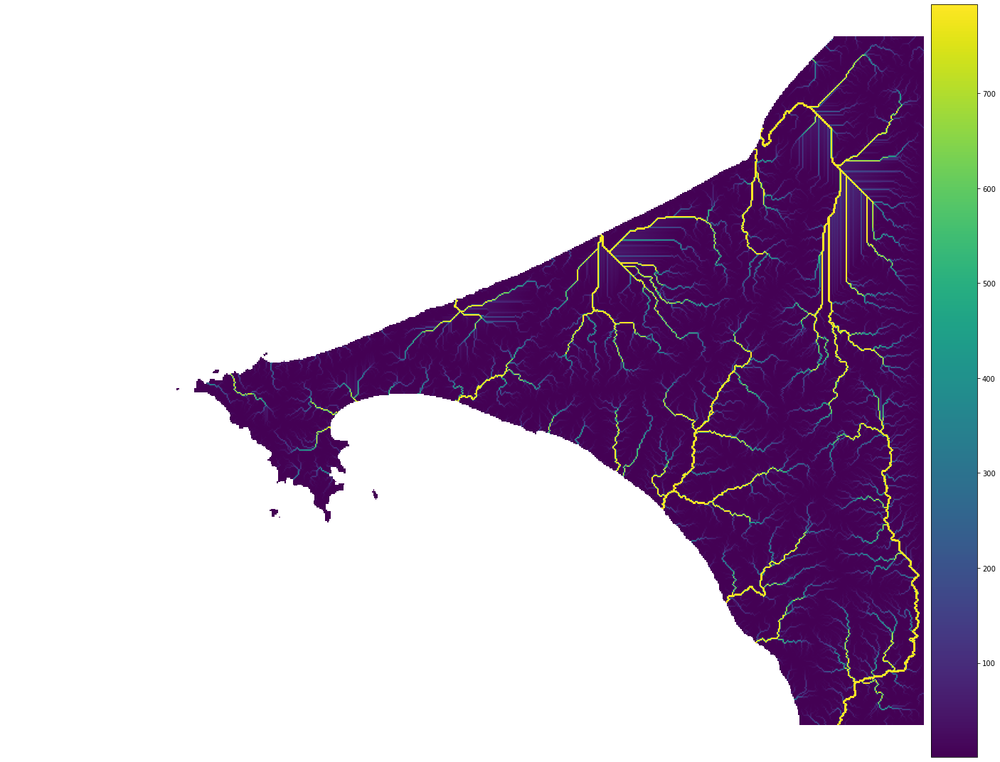

{'vmin': 1.0, 'vmax': 793.4680392950308}

In [23]:
rd.rdShow(dakar_flow_fill, axes=False, cmap="viridis", figsize=(20, 15))

## Terrain Attributes
---
Richdem also makes available several methods available to visualize common attributes of a DEM

In [24]:
dakar_aspect = rd.TerrainAttribute(dakar_dem, attrib="aspect")

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


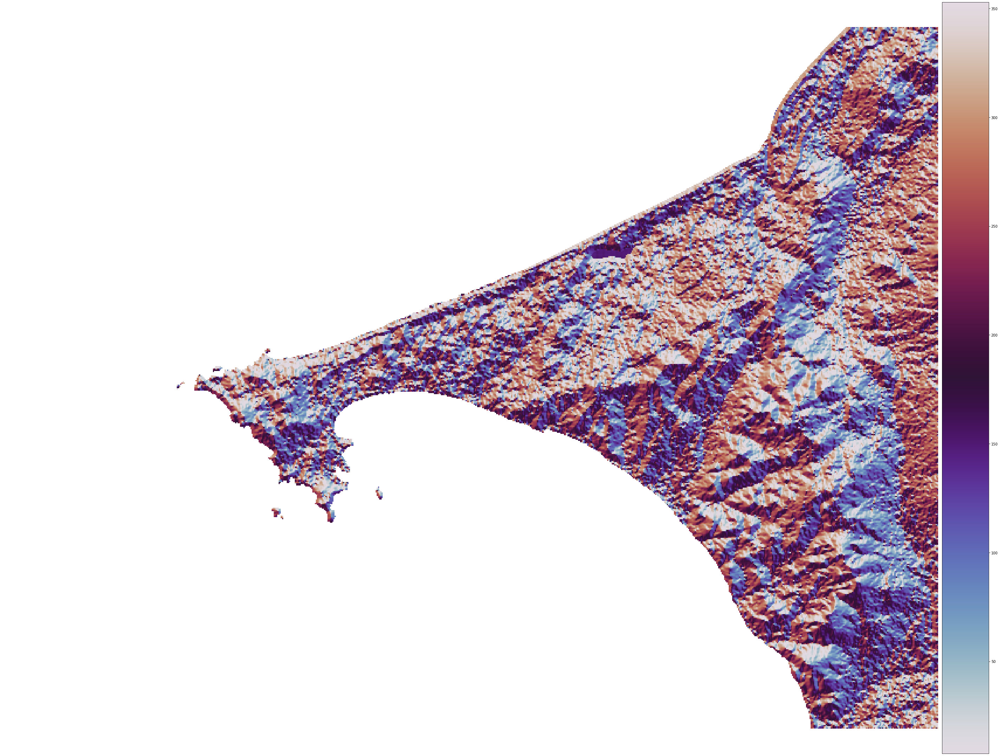

{'vmin': 7.669344711303712, 'vmax': 352.8804626464844}

In [30]:
rd.rdShow(dakar_aspect, axes=False, cmap="twilight", figsize=(40, 30))

In [37]:
dakar_slope = rd.TerrainAttribute(dakar_dem, attrib="slope_riserun")

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


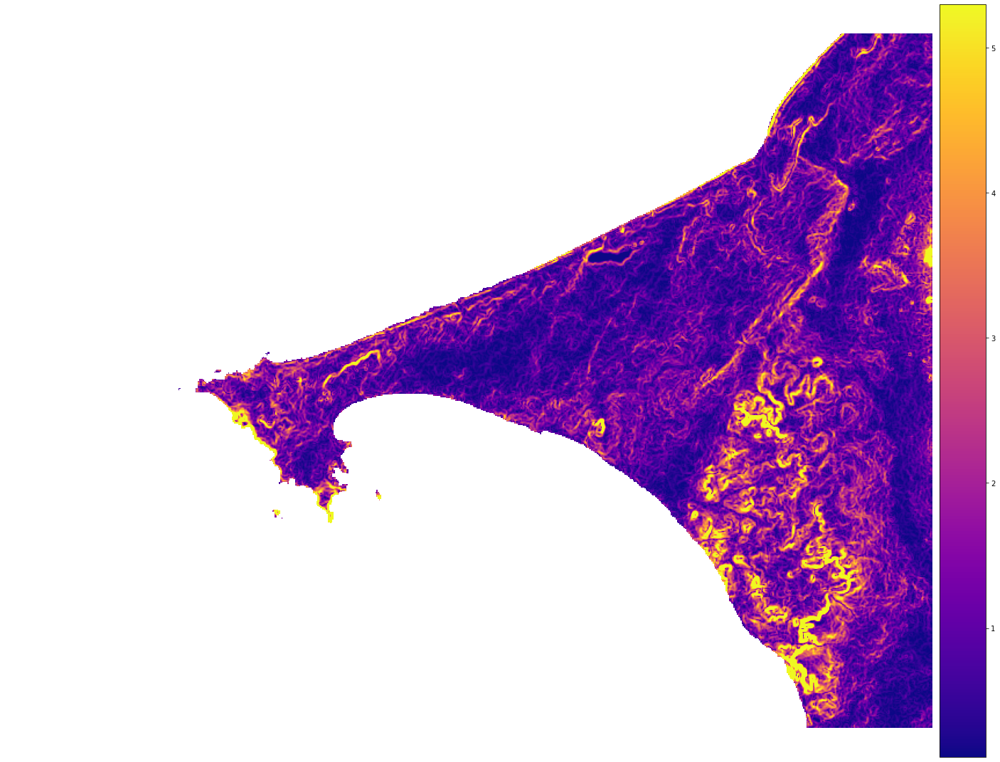

{'vmin': 0.11232959777116774, 'vmax': 5.297148227691641}

In [38]:
rd.rdShow(dakar_slope, axes=False, cmap="plasma", figsize=(20, 15))

By looking at the aspect of the conditioned DEM the modifications are made very visible

In [39]:
dakar_fill_aspect = rd.TerrainAttribute(dakar_fill, attrib="aspect")

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


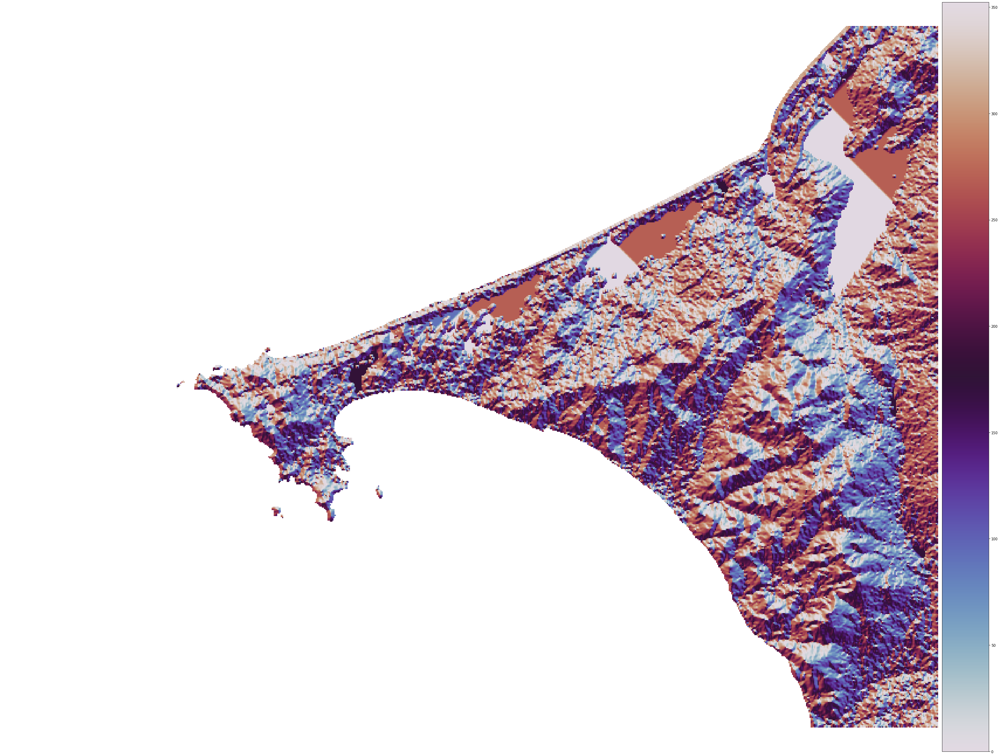

{'vmin': 0.0, 'vmax': 352.2765808105469}

In [40]:
rd.rdShow(dakar_fill_aspect, axes=False, cmap="twilight", figsize=(40, 30))

In [41]:
dakar_fill_slope = rd.TerrainAttribute(dakar_fill, attrib="slope_riserun")

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


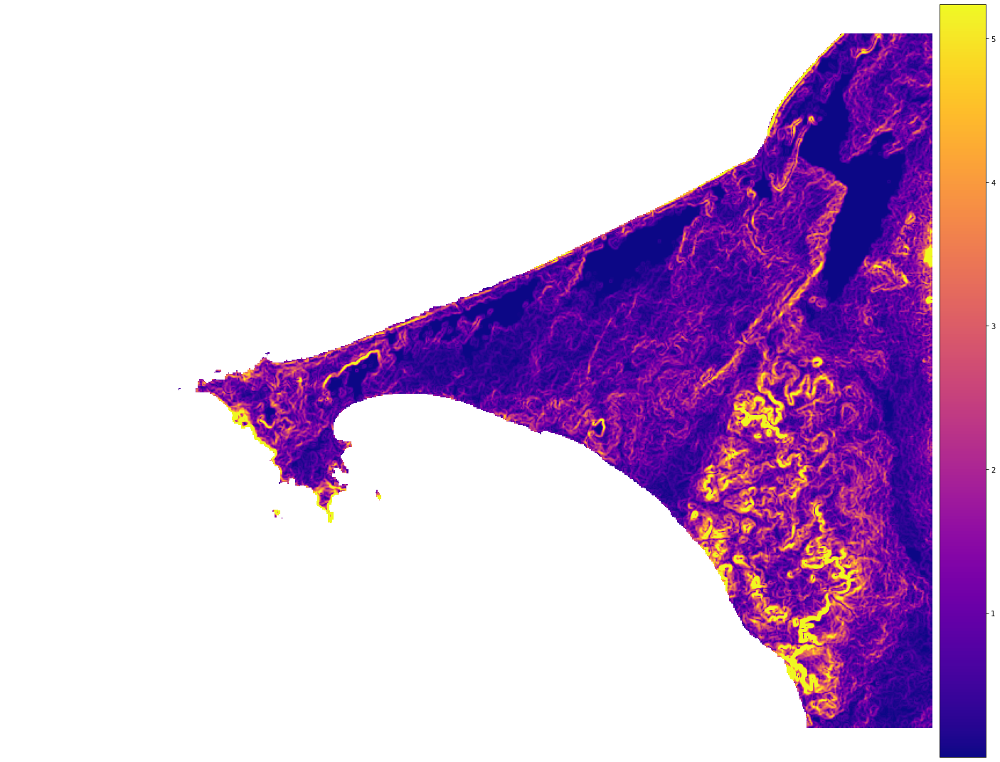

{'vmin': 4.76837158203125e-07, 'vmax': 5.234424877166745}

In [42]:
rd.rdShow(dakar_fill_slope, axes=False, cmap="plasma", figsize=(20, 15))

## Breaching Depressions (alternate)
---
An alternative to filling depressions is to breach the depressions. Breaching a depression modifies the DEM so that a path is made to drain the depression to it lowest egress. The advantage here is that modifications to the dem are much smaller.

In [61]:
dakar_breach = rd.BreachDepressions(dakar_dem)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [62]:
dakar_breach_diff = dakar_breach - dakar_dem

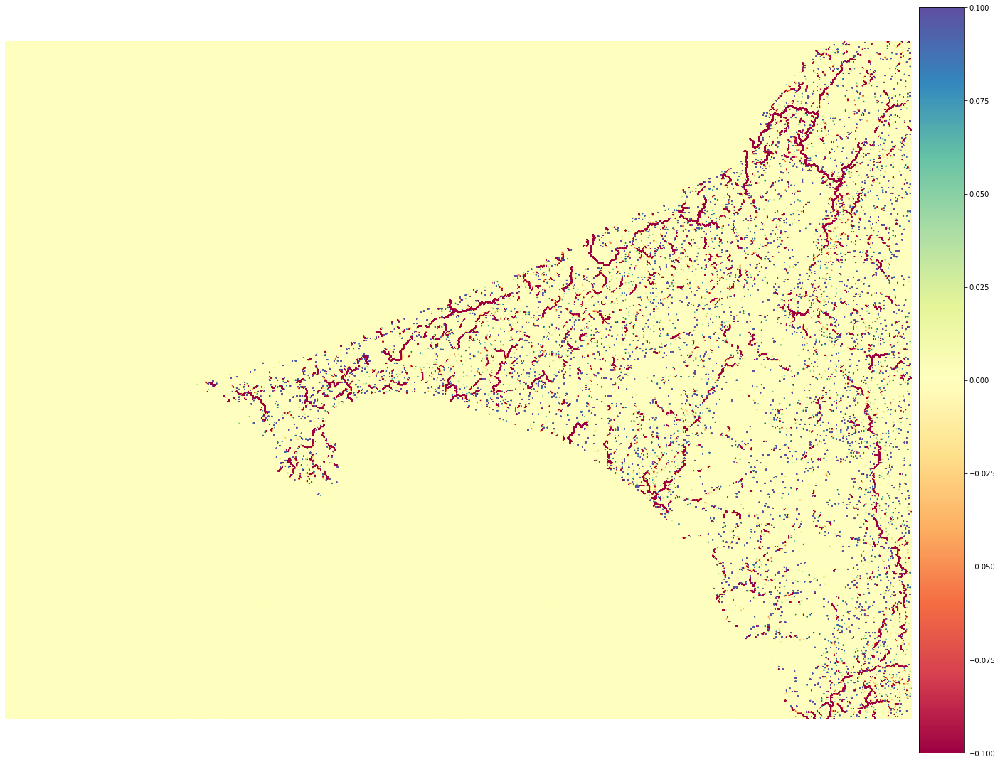

{'vmin': 0.0, 'vmax': 0.0}

In [63]:
rd.rdShow(dakar_breach_diff, axes=False, cmap="Spectral", figsize=(20, 15))

In [64]:
dakar_breach_resolved = rd.ResolveFlats(dakar_breach)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [67]:
dakar_conditioned= rd.FlowAccumulation(dakar_breach_resolved, method="Dinf")

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


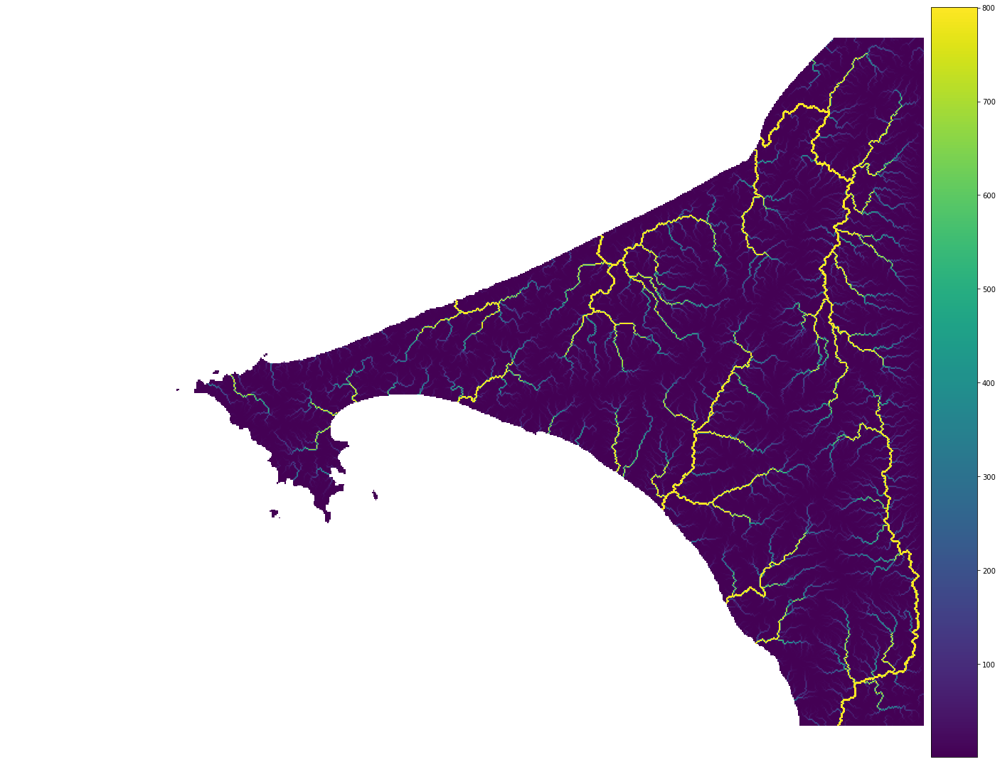

{'vmin': 1.0, 'vmax': 800.7005963031954}

In [68]:
rd.rdShow(dakar_conditioned, axes=False, cmap="viridis", figsize=(20, 15))

## Using SRTM DEM from the Datacube
---

In [69]:
import datacube

cube = datacube.Datacube(app="dakar_flood_pngs")
products = cube.list_products()
display_columns = ["name", "description", "platform", "instrument", "crs", "resolution"]
lat = (14.57695, 14.90730)
lon = (-17.53014, -17.09629)
time = ("2018-01-01", "2020-12-31")

query = {
    "x": lon,
    "y": lat,
    "time": time,
    "measurements": ["red", "green", "blue"],
    "output_crs": "EPSG:4326",
    "resolution": (-0.00027, 0.00027),
}
products[display_columns].sort_index()

,name,description,platform,instrument,crs,resolution
id,,,,,,
1,ls8_usgs_sr_scene,Landsat 8 USGS Collection 1 Higher Level SR sc...,LANDSAT_8,OLI_TIRS,NaN,NaN
2,ls7_usgs_sr_scene,Landsat 7 USGS Collection 1 Level2 Surface Ref...,LANDSAT_7,ETM,NaN,NaN
3,ls5_usgs_sr_scene,Landsat 5 USGS Collection 1 Level2 Surface Ref...,LANDSAT_5,TM,NaN,NaN
5,ls_usgs_wofs_scene,Historic Flood Mapping Water Observations from...,None,None,NaN,NaN
6,ls_usgs_fc_scene,Landsat Fractional Cover based on USGS Level 2...,None,None,NaN,NaN
11,ls_usgs_wofs_summary,Water Observations from Space Annual Statistics,None,None,ESRI:102022,"(-30, 30)"
12,srtm,1 second elevation model,SRTM,SIR,EPSG:4326,"(-0.00027777777778, 0.00027777777778)"
13,ga_ls8c_wofs_2_annual_summary,Water Observations from Space Annual Statistics,None,None,EPSG:6933,"(-30, 30)"
14,alos_palsar_mosaic,ALOS/PALSAR and ALOS-2/PALSAR-2 annual mosaic ...,ALOS/ALOS-2,PALSAR/PALSAR-2,EPSG:4326,"(-0.000222222222222, 0.000222222222222)"


In [70]:
srtm = cube.load(
    product="srtm",
    lat=lat,
    lon=lon,
    time=time,
    output_crs="EPSG:4326",
    resolution=(-0.00027, 0.00027),
)
srtm

<xarray.Dataset>
Dimensions:      (latitude: 1225, longitude: 1608, time: 1)
Coordinates:
  * time         (time) datetime64[ns] 2019-09-09
  * latitude     (latitude) float64 14.91 14.91 14.91 ... 14.58 14.58 14.58
  * longitude    (longitude) float64 -17.53 -17.53 -17.53 ... -17.1 -17.1 -17.1
    spatial_ref  int32 4326
Data variables:
    elevation    (time, latitude, longitude) int16 0 0 0 0 0 ... 34 33 32 32 29
Attributes:
    crs:           EPSG:4326
    grid_mapping:  spatial_ref

### Convert xarray to rdarray

In [71]:
srtm_array = srtm.to_array()[0][0]
srtm_array

<xarray.DataArray (latitude: 1225, longitude: 1608)>
array([[ 0,  0,  0, ...,  9,  9, 12],
       [ 0,  0,  0, ...,  8,  8, 10],
       [ 0,  0,  0, ...,  9,  9, 10],
       ...,
       [ 0,  0,  0, ..., 31, 31, 29],
       [ 0,  0,  0, ..., 32, 32, 29],
       [ 0,  0,  0, ..., 32, 32, 29]], dtype=int16)
Coordinates:
    time         datetime64[ns] 2019-09-09
  * latitude     (latitude) float64 14.91 14.91 14.91 ... 14.58 14.58 14.58
  * longitude    (longitude) float64 -17.53 -17.53 -17.53 ... -17.1 -17.1 -17.1
    spatial_ref  int32 4326
    variable     <U9 'elevation'
Attributes:
    crs:           EPSG:4326
    grid_mapping:  spatial_ref

### Flood Fill for ocean areas

In [72]:
from skimage.morphology import flood_fill

In [73]:
srtm_array_mod = flood_fill(flood_fill(srtm_array.values, (1224, 0), -9999), (0, 0), -9999)

In [74]:
dakar_srtm = rd.rdarray(srtm_array_mod.astype(float), no_data=-9999)
dakar_srtm

rdarray([[-9.999e+03, -9.999e+03, -9.999e+03, ...,  9.000e+00,
           9.000e+00,  1.200e+01],
         [-9.999e+03, -9.999e+03, -9.999e+03, ...,  8.000e+00,
           8.000e+00,  1.000e+01],
         [-9.999e+03, -9.999e+03, -9.999e+03, ...,  9.000e+00,
           9.000e+00,  1.000e+01],
         ...,
         [-9.999e+03, -9.999e+03, -9.999e+03, ...,  3.100e+01,
           3.100e+01,  2.900e+01],
         [-9.999e+03, -9.999e+03, -9.999e+03, ...,  3.200e+01,
           3.200e+01,  2.900e+01],
         [-9.999e+03, -9.999e+03, -9.999e+03, ...,  3.200e+01,
           3.200e+01,  2.900e+01]])

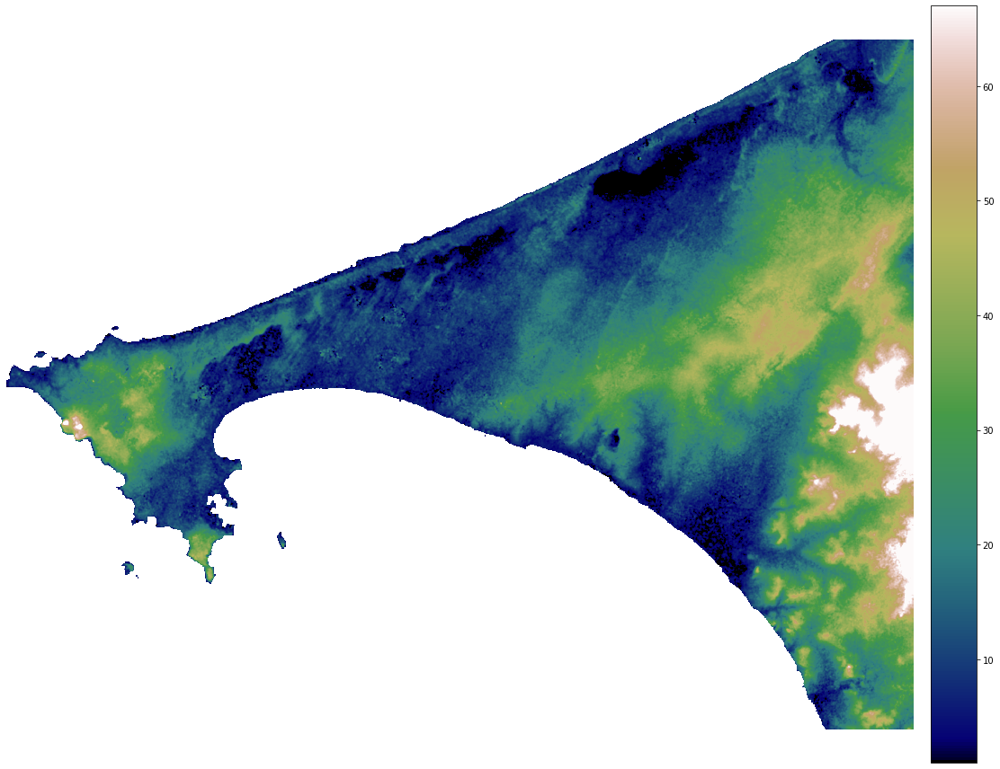

{'vmin': 1.0, 'vmax': 67.0}

In [75]:
rd.rdShow(dakar_srtm, axes=False, cmap="gist_earth", figsize=(16, 12))

In [76]:
srtm_flow = rd.FlowAccumulation(dakar_srtm, method="Dinf")

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


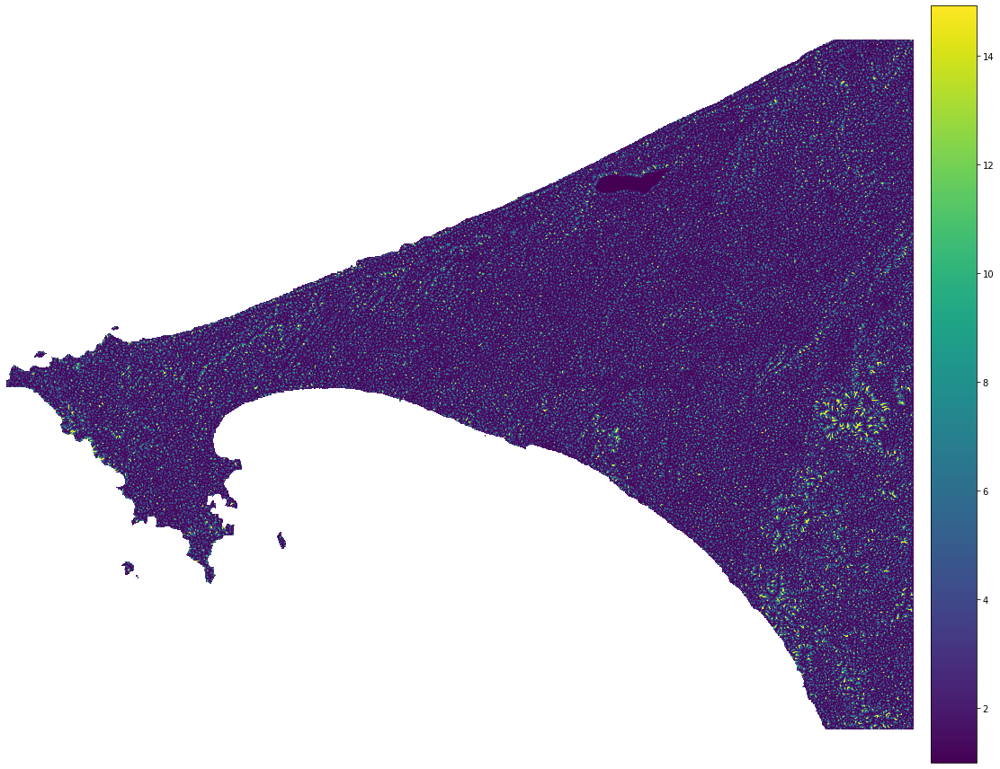

{'vmin': 1.0, 'vmax': 14.920520401004808}

In [77]:
rd.rdShow(srtm_flow, axes=False, cmap="viridis", figsize=(16, 12))

In [78]:
srtm_filled = rd.FillDepressions(dakar_srtm, epsilon=False)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [79]:
srtm_diff = srtm_filled - dakar_srtm

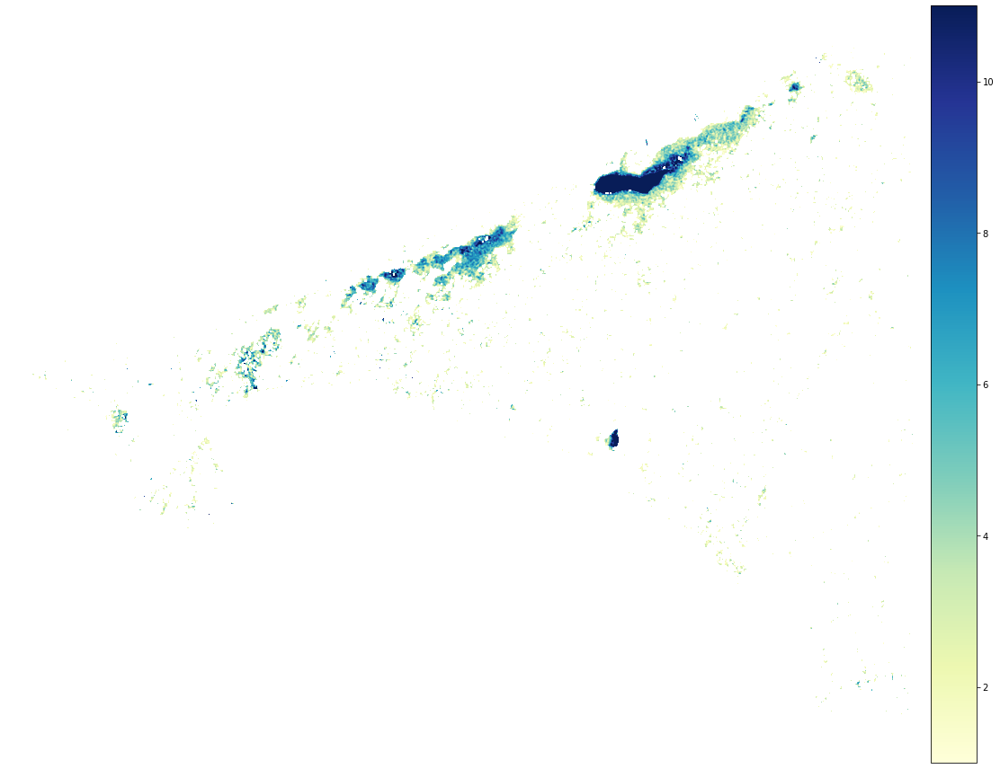

{'vmin': 1.0, 'vmax': 11.0}

In [80]:
rd.rdShow(
    rd.rdarray(np.where(srtm_diff > 0, srtm_diff, np.nan), no_data=np.nan),
    axes=False,
    cmap="YlGnBu",
    figsize=(16, 12),
)

In [81]:
srtm_barnes = rd.ResolveFlats(srtm_filled)

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


In [82]:
srtm_fill_flow = rd.FlowAccumulation(srtm_barnes, method="Dinf")

Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)
Warning! No geotransform defined. Choosing a standard one! (Top left cell's top let corner at <0,0>; cells are 1x1.)


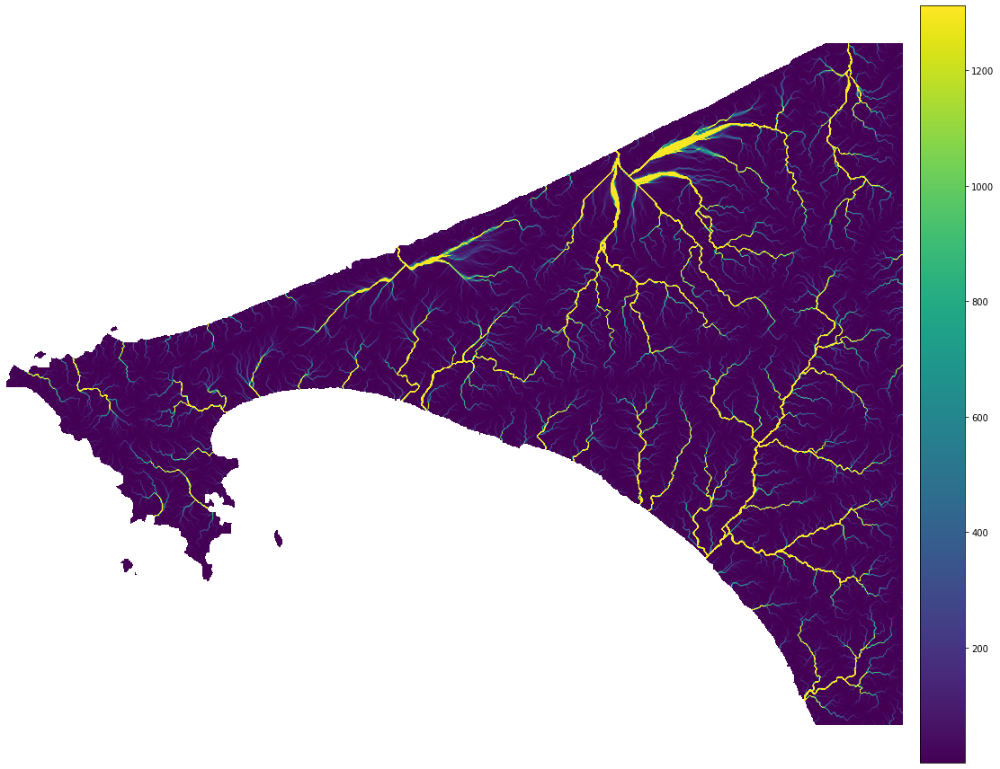

{'vmin': 1.0, 'vmax': 1312.0099822593495}

In [83]:
rd.rdShow(srtm_fill_flow, axes=False, cmap="viridis", figsize=(16, 12))